In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import profile_report
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

In [28]:
df = pd.read_csv("winequality_red.csv")

In [29]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [5]:
df.profile_report()

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [30]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [31]:
x = df.drop("quality", axis = 1)
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [32]:
y = df["quality"]

In [33]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 30)

In [34]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1199, 11)
(400, 11)
(1199,)
(400,)


In [35]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()

In [36]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [37]:
import sklearn

from sklearn import tree


[Text(611.8672813841201, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(358.4678513948498, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(225.51252682403432, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(85.58594420600858, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(59.931115879828326, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(20.11673819742489, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(12.45321888412017, 694.6, 'X[6] <= 29.5\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(8.621459227467811, 634.2, 'X[10] <= 9.025\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(4.789699570815451, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(12.45321888412

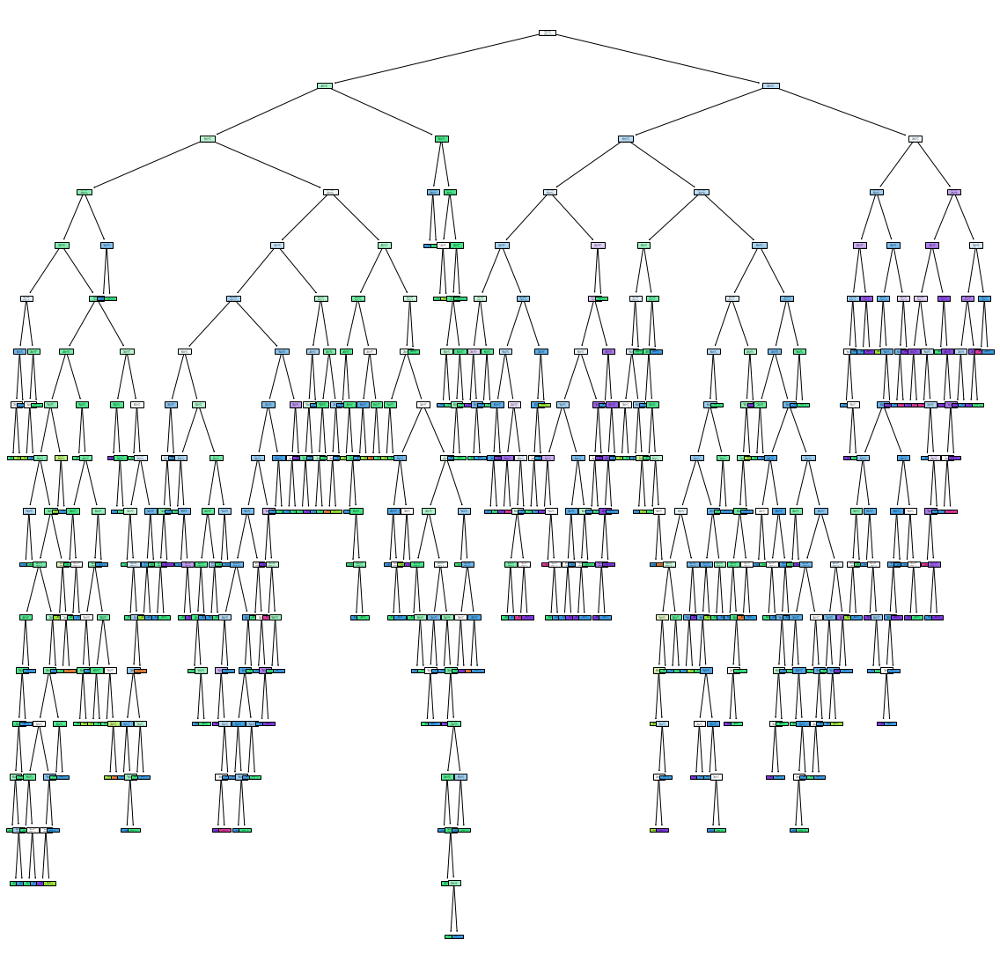

In [38]:
plt.figure(figsize = (20, 20))
tree.plot_tree(dt_model, filled = True)

In [21]:
sklearn.__version__

'0.24.1'

In [115]:
df1 = df.head(500)

In [116]:
x1 = df1.drop("quality", axis = 1)
y1 = df1.quality
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

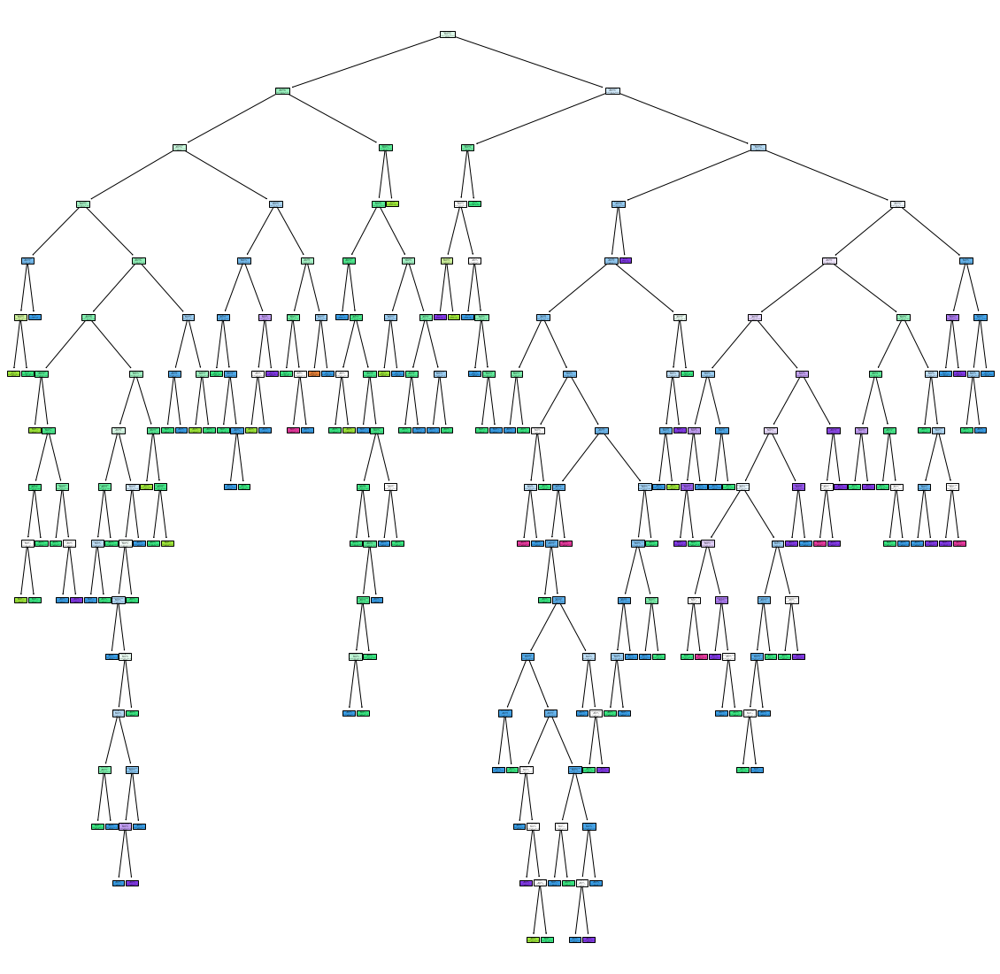

In [117]:
plt.figure(figsize = (20,20))
tree.plot_tree(dt_model1, filled = True, class_names = [str(i) for i in set(y1)], feature_names = x1.columns)
plt.savefig("dt_model_1")# to save it in image format

In [118]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [119]:
dt_model1.score(x1, y1)

1.0

In [120]:
dt_model.score(x_test, y_test)

0.4425

In [121]:
#Compute the pruning path during Minimal Cost-Complexity Pruning.
path = dt_model.cost_complexity_pruning_path(x1, y1)

In [122]:
ccp_alpha = path["ccp_alphas"]

In [123]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.00203333, 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
       0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
       0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
       0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
       0.00373333, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
       0.00466667, 0.0048    , 0.00495726, 0.00504242, 0.00508235,
       0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
       0.00656364, 0.00671079, 0.0067591 , 0.00688352, 0.00688

In [124]:
dt_model2 = []

for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = ccp)
    dt_m.fit(x1, y1)
    dt_model2.append(dt_m)

In [125]:
#So we have build 8 decision tree
print(len(dt_model2))
dt_model2

90


[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 Deci

In [126]:
#Q: But which model to select
#Ans : Select which is less overfitted.

In [127]:
train_score = [model.score(x1, y1) for model in dt_model2]
train_score

[1.0,
 0.998,
 0.998,
 0.994,
 0.992,
 0.99,
 0.988,
 0.96,
 0.962,
 0.962,
 0.962,
 0.964,
 0.962,
 0.958,
 0.962,
 0.964,
 0.964,
 0.964,
 0.962,
 0.954,
 0.948,
 0.93,
 0.93,
 0.93,
 0.93,
 0.928,
 0.934,
 0.928,
 0.93,
 0.932,
 0.926,
 0.92,
 0.91,
 0.912,
 0.91,
 0.908,
 0.91,
 0.912,
 0.908,
 0.902,
 0.9,
 0.896,
 0.894,
 0.892,
 0.89,
 0.884,
 0.886,
 0.886,
 0.884,
 0.878,
 0.88,
 0.868,
 0.866,
 0.858,
 0.86,
 0.858,
 0.846,
 0.852,
 0.848,
 0.824,
 0.818,
 0.814,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.596,
 0.478]

In [128]:
test_score = [model.score(x_test, y_test) for model in dt_model2]
test_score

[0.575,
 0.5775,
 0.58,
 0.595,
 0.6175,
 0.5975,
 0.5875,
 0.5775,
 0.5725,
 0.595,
 0.5675,
 0.6,
 0.5825,
 0.595,
 0.59,
 0.58,
 0.595,
 0.5875,
 0.59,
 0.5875,
 0.61,
 0.59,
 0.5875,
 0.595,
 0.5975,
 0.59,
 0.6025,
 0.59,
 0.5925,
 0.6,
 0.59,
 0.59,
 0.5925,
 0.605,
 0.6075,
 0.5775,
 0.5925,
 0.5825,
 0.605,
 0.6075,
 0.615,
 0.615,
 0.6025,
 0.5925,
 0.6175,
 0.6,
 0.61,
 0.605,
 0.6075,
 0.6025,
 0.5975,
 0.6025,
 0.5975,
 0.6175,
 0.61,
 0.605,
 0.61,
 0.6075,
 0.615,
 0.6075,
 0.6075,
 0.6075,
 0.615,
 0.6175,
 0.6175,
 0.61,
 0.605,
 0.605,
 0.5975,
 0.59,
 0.59,
 0.59,
 0.5825,
 0.5825,
 0.5925,
 0.59,
 0.585,
 0.5825,
 0.5825,
 0.56,
 0.5725,
 0.5625,
 0.555,
 0.555,
 0.54,
 0.5775,
 0.5775,
 0.5775,
 0.5775,
 0.4225]

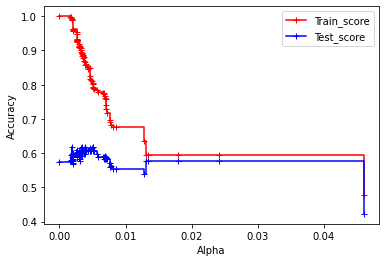

In [135]:
fig, ax = plt.subplots()
ax.plot(ccp_alpha, train_score,'r-+', label = "Train_score", drawstyle='steps-post')
ax.plot(ccp_alpha, test_score, 'b-+', label = "Test_score", drawstyle = 'steps-post')
plt.xlabel("Alpha")
plt.ylabel("Accuracy")
ax.legend()

In [130]:
dt_model_ccp = DecisionTreeClassifier(ccp_alpha = .014, random_state = 0)
dt_model_ccp.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

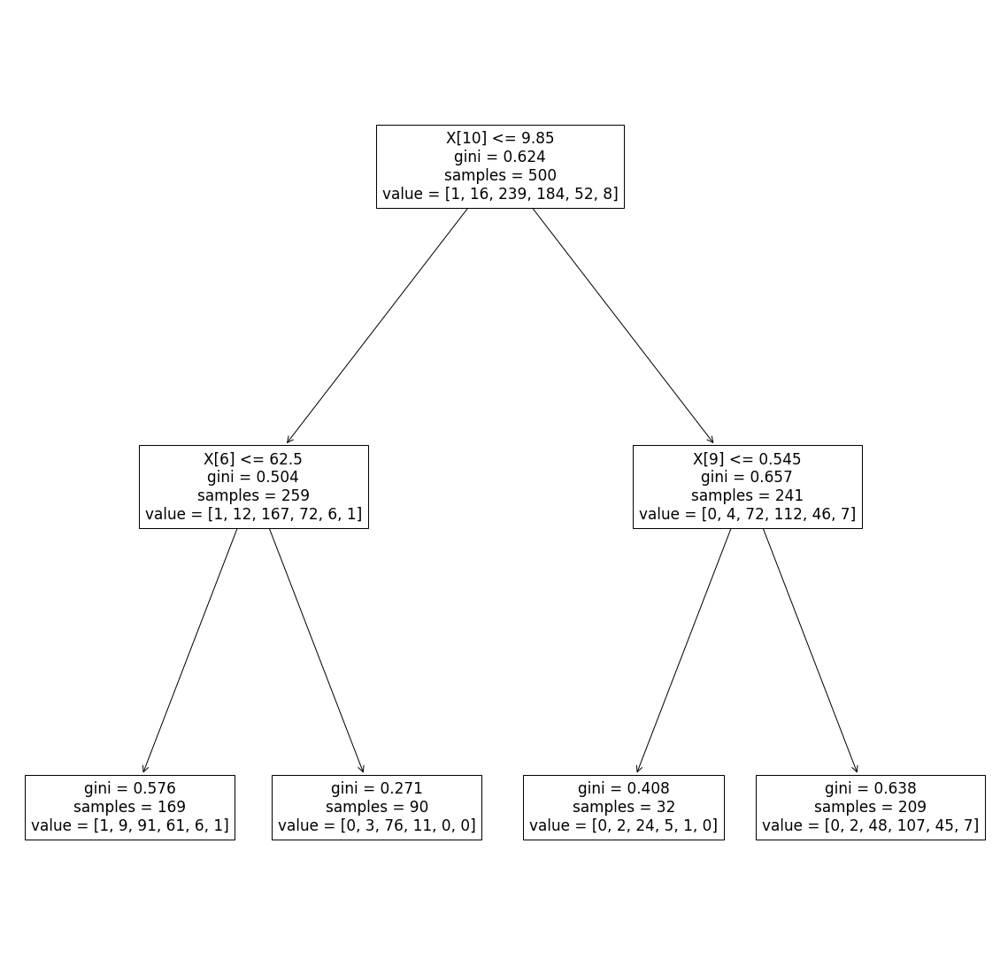

In [132]:
plt.figure(figsize = (20, 20))
tree.plot_tree(dt_model_ccp)

In [133]:
dt_model_ccp.score(x_test, y_test)

0.5775

In [134]:
dt_model_ccp.score(x1, y1)

0.596

In [136]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [147]:
grid_param = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': range(2, 40 , 1),
    'min_samples_split': range(2, 10, 1),
    'min_samples_leaf': range(1, 10, 1), 
    'ccp_alpha': np.random.rand(20)
}

In [148]:
grid_ccp = GridSearchCV(dt_model_ccp, param_grid = grid_param,cv = 10, n_jobs = -1 )

In [149]:
grid_ccp.fit(x1, y1)

C:\Users\Hp\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"


KeyboardInterrupt: 

In [ ]:
grid_cpp.best_param_

In [139]:
dt_cpp_new = DecisionTreeClassifier(criterion = 'entropy', max_depth = 15, min_samples_leaf = 2, min_samples_split = 2, splitter = 'random')

In [140]:
dt_cpp_new.fit(x1, y1)

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2,
                       splitter='random')

In [141]:
dt_cpp_new.score(x1, y1)

0.882

In [143]:
dt_cpp_new.score(x_test, y_test)

0.6